In [1]:
%run lgs03a_data_unification.ipynb

In [2]:
epistatic_pairs_pos = {gene : 
                     doublemuts[doublemuts.gene==gene+'GFP'].groupby('position_pseudo').apply(
                                                                             lambda x: list(x['epistasis']))
                     for gene in ['amac', 'amacV14L', 'cgre', 'pplu', 'av']}
epistatic_pairs_pos = {gene : dict(epistatic_pairs_pos[gene]) for gene in epistatic_pairs_pos}

In [41]:
%run lgs_figures_functions_new.ipynb

{'amacGFP': 2.652246341003323, 'cgreGFP': 2.7708520116421442, 'ppluGFP': 2.7708520116421442, 'avGFP': 1.283419239}


<Figure size 432x288 with 0 Axes>

In [5]:
import warnings
warnings.filterwarnings(action='ignore')

In [6]:
genes = ['amac','av','cgre','pplu']

In [4]:
import cmocean
from matplotlib.colors import ListedColormap
# c = matplotlib.cm.GnBu
# c = sns.cm.crest_r
c = cmocean.cm.rain_r
# c = plt.get_cmap('mako')
# c = ListedColormap(cmocean.color_palette('algae', 256))

# colors = {'amacV14L':c(0), 'V14L':c(0),'amacV14LGFP':c(0),'amacGFP:V14L':c(0), 
#           'amac':c(50), 'amacGFP':c(50), 
#           'cgre':c(125), 'cgreGFP':c(125),
#            'pplu':c(200),  'ppluGFP':c(200),'ppluGFP2':c(200),
#           'av':c(240), 'avGFP':c(240), }

colors = {'amacV14L':c(0), 'V14L':c(0),'amacV14LGFP':c(0),'amacGFP:V14L':c(0), 
          'amac':c(50), 'amacGFP':c(50), 
          'cgre':c(110), 'cgreGFP':c(110),
           'pplu':c(170),  'ppluGFP':c(170),'ppluGFP2':c(170),
          'av':c(220), 'avGFP':c(220), }

## Fig. 1

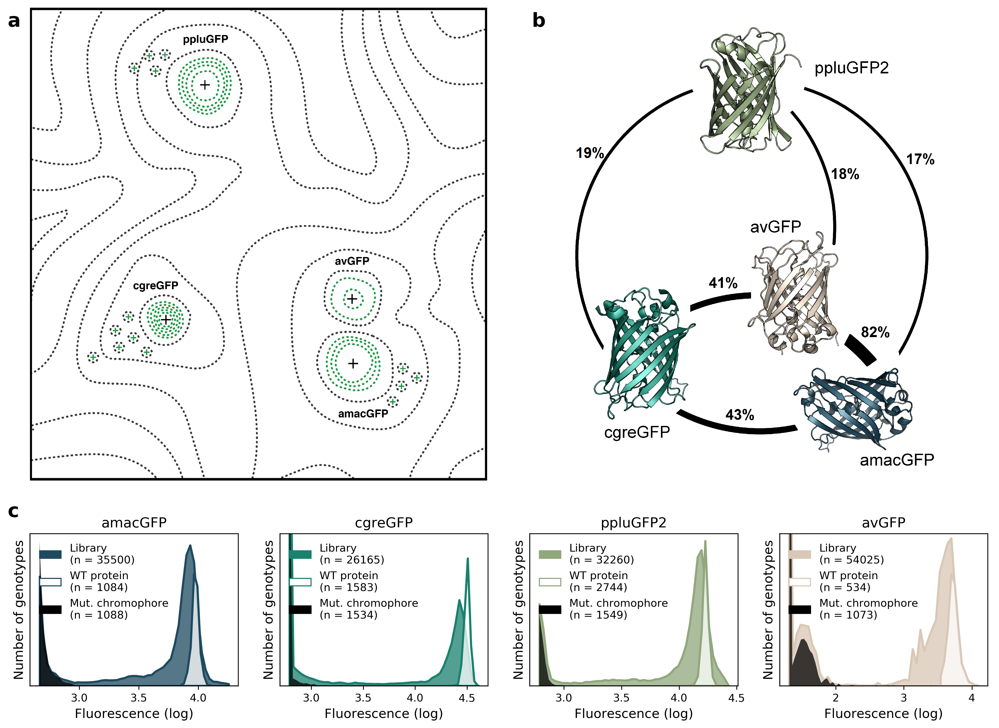

In [7]:
plt.figure(figsize=[16,12], dpi=300)

plt.subplot(4,4,(1,10))
show_image(os.path.join(figures_folder, 'other_images', 'katya_fig1_v2.png'))

plt.subplot(4,4,(3,12))
show_image(os.path.join(figures_folder, 'other_images', 'structures_identity_gfps2.png'))


for i,g in zip([13,14,15,16], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(4,4,i)
    plot_library_distributions(g, data_nt, data_aa, ax)   
    plt.ylabel('Number of genotypes', fontsize=12)
    
    if i==13:
        plt.text(2.4, 19500, 'a', fontsize=18, weight='semibold')
        plt.text(6.8, 19500, 'b', fontsize=18, weight='semibold')
        plt.text(2.4, 5000, 'c', fontsize=18, weight='semibold')

# plt.savefig(os.path.join(figures_folder,'eLife_final_figs', 'elife_fig1.png'), dpi=300)

## Figure 2

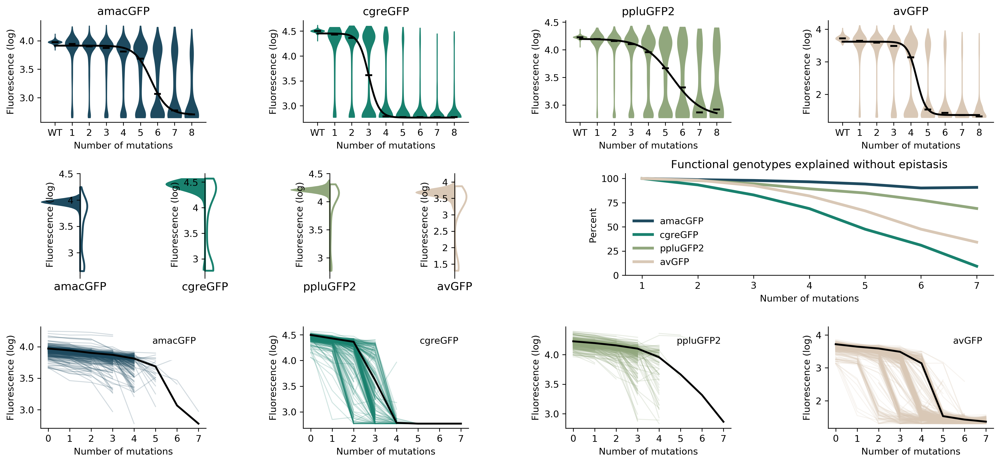

In [10]:
plt.figure(figsize=[15,7], dpi=300)

# Violinplots of N-mutants
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(3,4,i)
    get_fitnesses_by_nmut(gene, 9, data_nt, data_aa , fit=True)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.title(names[gene])
    
# Buried vs exposed residues
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    plt.subplot(3,8,i+8)
    plot_buried_vs_exposed_violins_singles(gene)
    plt.ylabel('Fluorescence (log)', fontsize=10)
    
# Landscapes pf single mutants
for i,gene in zip([1,2,3,4], ['amacGFP', 'cgreGFP', 'ppluGFP', 'avGFP']):
    ax = plt.subplot(3,4,i+8)
    plot_singlemut_landscapes(gene)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
# Expected vs observed bright genotypes
ax = plt.subplot(3,2,4)
plot_predicted_bright_vs_real(data_aa, False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
label_plot_axis(x = 'Number of mutations', t='Functional genotypes explained without epistasis', 
                y='Percent', fontsize_t=12, fontsize_x=10, fontsize_y=10)
    
plt.tight_layout(pad=1)

## Fig. 3

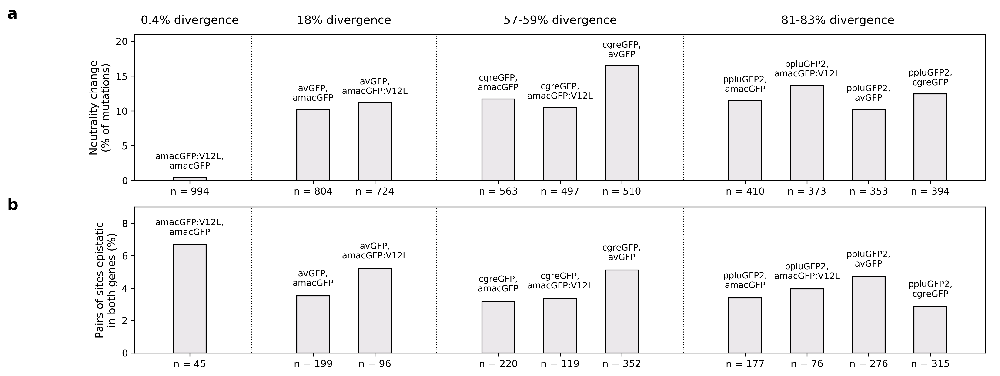

In [13]:
fig = plt.figure(figsize=[15,6], dpi=300)
make_figure_letters(fig, {'a':(-0.15,1.05), 'b':(-0.15,0.45)}, fontsize=16)

ax1,ax2 = fig.add_subplot(2,1,1), fig.add_subplot(2,1,2)
plot_bars_effectchange_epimaintain_split(ax1,ax2, 1.5, c=cmocean.cm.rain_r(250))
plt.tight_layout()
# plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_fig3.png'), dpi=300)

## Figure 5: Results of neural net predictions

In [15]:
stds = {'amac':0.031, 'cgre':0.028, 'pplu':0.027}

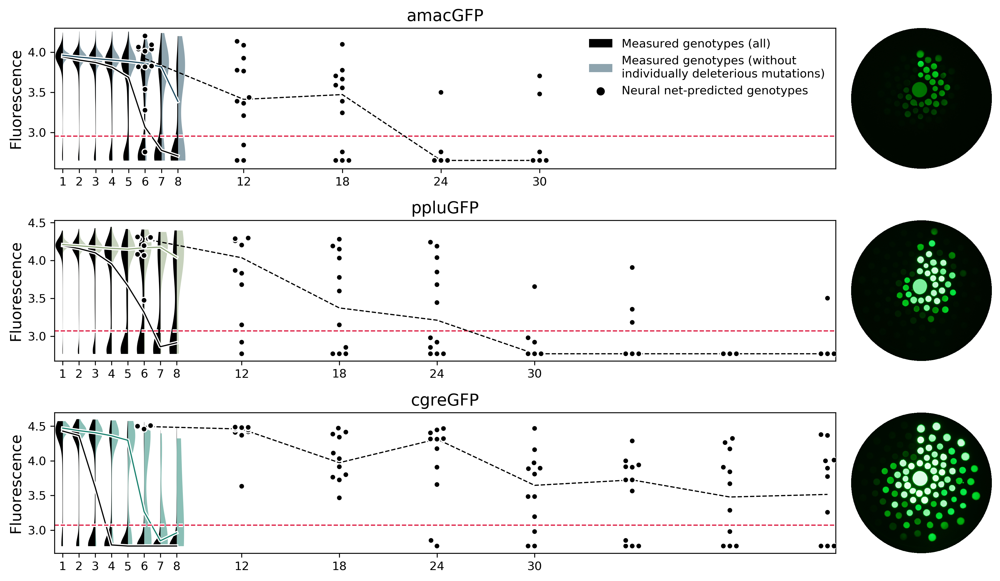

In [22]:
fig = plt.figure(figsize=[12,7], dpi=300)

for i,gene in [(1,'amac'), (7,'pplu'), (13,'cgre')]:
    plt.subplot(3,6,(i, i+4))
    plot_predictions(gene,mode='full', threshold = stds[gene]*3,
                 color=[[colors[gene],colors[gene]],['k','k'],], )
    
    if i==1: # legend
        plt.hist([-10], color='k', label='Measured genotypes (all)')
        plt.hist([-10], bottom=3, color=colors['amac'], alpha=0.5, 
                 label='Measured genotypes (without\nindividually deleterious mutations)')
        plt.scatter([-1],[3],color='k', label = 'Neural net-predicted genotypes', zorder=10)
        plt.legend(frameon=False, loc='upper right')
        plt.ylim(2.55, 4.3)
        
    label_plot_axis(y='Fluorescence', t=f'{gene}GFP', fontsize_t=14)
    plt.xticks(list(range(8))+[11,17,23,29], list(range(1,9))+[12,18,24,30])

    plt.subplot(3,6,i+5)
    show_image(os.path.join(figures_folder, 'other_images', f'prediction_blobs_{gene}.png'))
    
plt.tight_layout()

## Suppl. Fig. 2: Library sorting

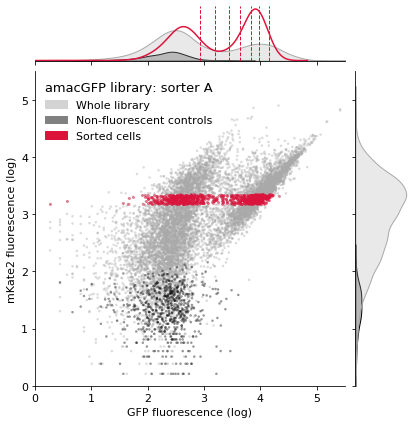

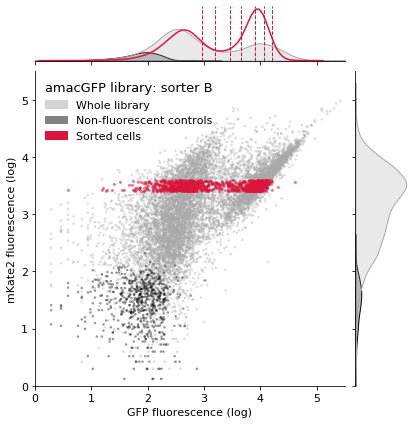

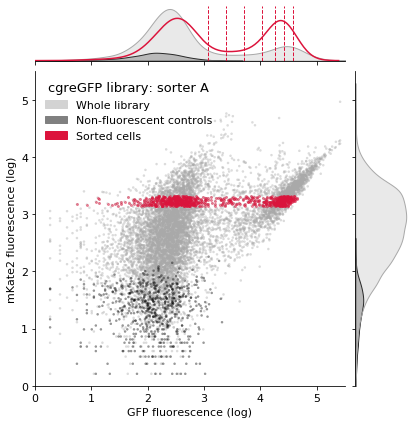

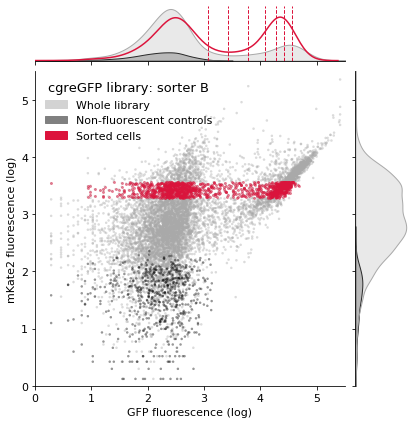

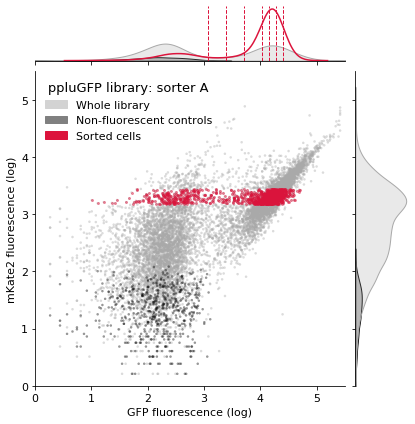

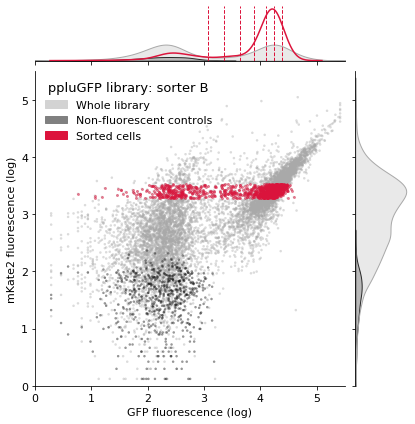

In [29]:
for gene in ['amac', 'cgre', 'pplu']:
    for machine in ['A', 'B']:
        sortingplot_library_scatter(gene, machine)
#         plt.savefig(os.path.join(figures_folder, gene+machine+'_sortingscatter.png'), format='png', dpi=500)

## Suppl. Fig. 9: Extant vs non-extant mutations

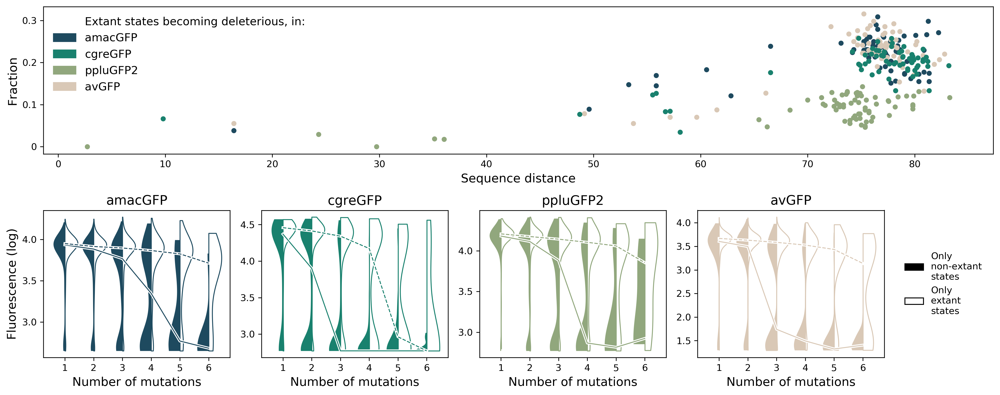

In [27]:
fig = plt.figure(figsize=[15,6], dpi=300)
make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)

j=9

# scatterplot of extant states becoming deleterious
plt.subplot(2,j,(1,j))
for gene in ['amac','av','cgre','pplu']:
    compare_against_extant(gene, data_aa, nok=-0.15, overlap_n=1, s=20, marker='o')
legendary(['w']+[colors[gene] for gene in ['amac','cgre','pplu','av']], 
          ['Extant states becoming deleterious, in:','amacGFP','cgreGFP','ppluGFP2','avGFP'],
         fontsize=12, )
plt.yticks([0,0.1,0.2,0.3],[0,0.1,0.2,0.3])
label_plot_axis(x='Sequence distance', y='Fraction')

# violin plots of extant v. non-extant mutation effects
i = j+1
for gene in ['amac','cgre','pplu','av',]:
    ax = fig.add_subplot(2,j,(i,i+1))
    plot_extant_vs_nonextant_muts(gene, data_aa, n=7, )
    plt.title(names[gene], fontsize=14)
    if  i==j+1:
        plt.ylabel('Fluorescence (log)')
    i += 2
#     ax.get_legend().remove()
    
ax = fig.add_subplot(2,j,j*2)
legendary(['k','w'], ['Only\nnon-extant \nstates', 'Only\nextant\nstates'], ['k','k'], loc='center right')
plt.axis('off')
    
plt.tight_layout()

## Suppl. Fig. 3: Mutation effects by position

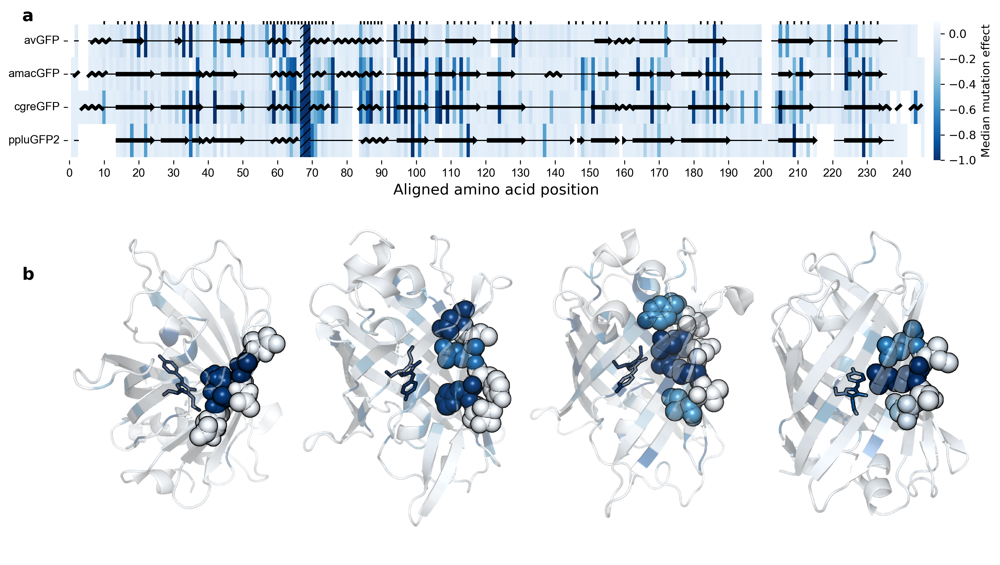

In [28]:
fig = plt.figure(figsize=[13,7], dpi=300)
make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)

ax1 = fig.add_subplot(3,1,1)
plot_positional_effects_heatmap(df=df_effects_singles_scaled, cm = 'Blues_r')
plt.title('')

ax2 = fig.add_subplot(3,1,(2,3))
show_image(os.path.join(figures_folder, 'other_images', 'allGFPs_scaled_effectsByPos2.png'))
    
plt.tight_layout()

## Suppl. Fig. 4: Pairwise epistasis, general

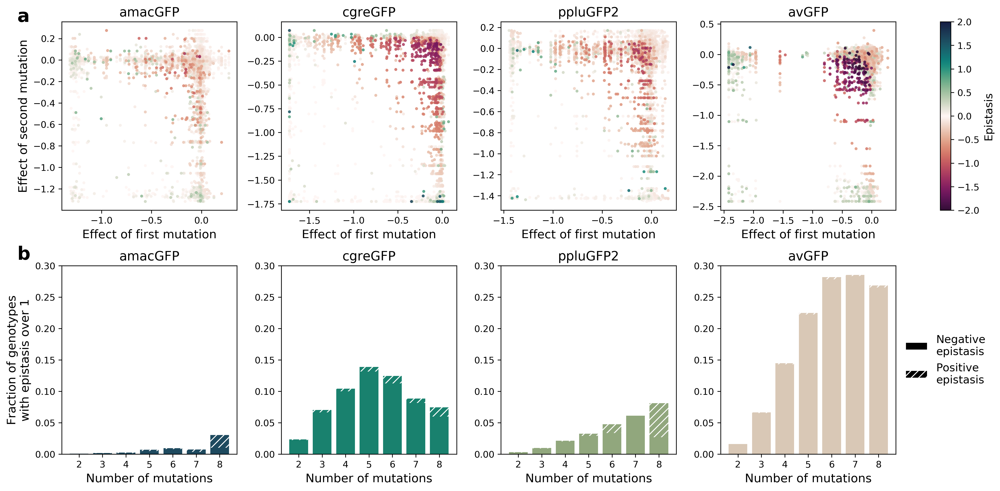

In [29]:
fig = plt.figure(figsize=[16,8], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.45)}, fontsize=20)


j = 17
for i,gene in zip(range(1,j*2,4), ['amac', 'cgre', 'pplu', 'av']):
    ax1 = fig.add_subplot(2,j,(i, i+3))
    doublemut_scatterplot(gene, cm = cmocean.cm.curl_r) 
    plt.title(names[gene], fontsize=14)
    
    if i>1:
        plt.ylabel('')
    ax2 = fig.add_subplot(2,j,(i+j,i+j+3))
    barplot_epistasis(gene, e=1)
    plt.title(names[gene], fontsize=14)
    if i>1:
        plt.ylabel('')
    plt.ylim(0, 0.3)
        

ax3 = fig.add_subplot(2,j,j)
norm = matplotlib.colors.Normalize(vmin=-2, vmax=2)
cb1 = matplotlib.colorbar.ColorbarBase(ax3, cmap=cmocean.cm.curl_r,norm=norm,orientation='vertical')
cb1.ax.tick_params(labelsize=10)
cb1.set_label('Epistasis',color='k',size=12)
        
ax4 = fig.add_subplot(2,j,j*2)
plt.legend([mpatches.Patch(facecolor='k', edgecolor='w'),
    mpatches.Patch(facecolor='k', hatch='///', edgecolor='w')], ['Negative\nepistasis', 'Positive\nepistasis'],
          frameon=False, loc='center', fontsize=12)
plt.axis('off')

plt.tight_layout() 

## Suppl. Fig. 6: Distances between amino acid pairs

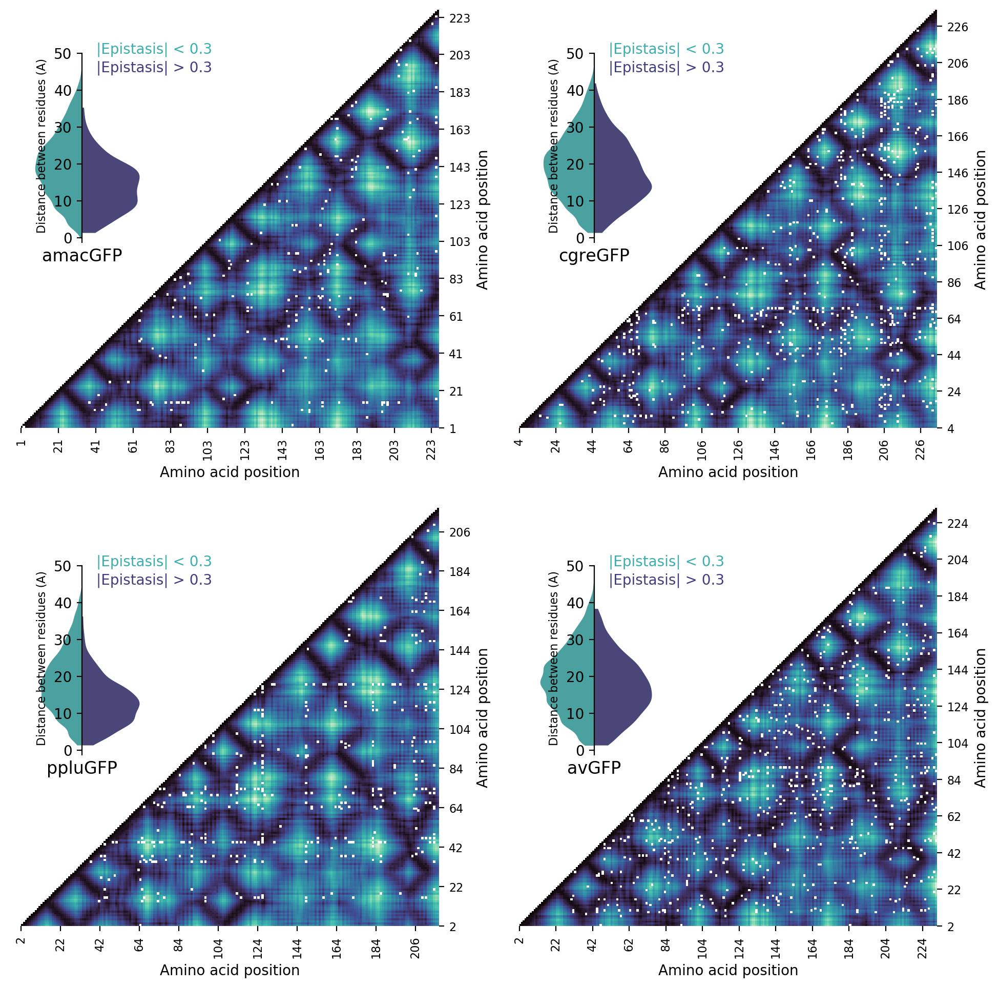

In [30]:
plot_all_distance_maps(df=doublemuts, c = sns.cm.mako)

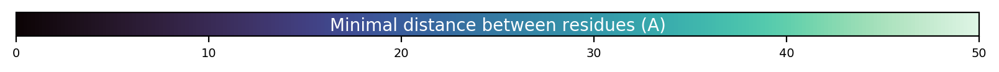

In [91]:
mako = ListedColormap(sns.color_palette('mako', 256))
fig,ax = plt.subplots(figsize=[10,0.5], dpi=200)
fig.subplots_adjust(bottom=0.5)

norm = matplotlib.colors.Normalize(vmin=0, vmax=50)
cb1 = matplotlib.colorbar.ColorbarBase(ax, cmap=mako,norm=norm,orientation='horizontal')
cb1.ax.tick_params(labelsize=7)
cb1.set_label('Minimal distance between residues (A)',labelpad=-25, color='w',)
plt.savefig(os.path.join(figures_folder, 'suppl_fig7_colorbar.png'),dpi=300)

Relationship of physical distance between two residues and their observed epistasis. Heatmaps show, for each gene, the minimal distance in Angstroms between two positions, with pairs of sites showing epistatic interactions over 0.3 shown in white. Inset violin plots show the distribution of distances between non-epistatic and epistatic pairs; in all cases, epistatic pairs tend to be physically closer (Mann Whitney U, p < 10^-13)

## Suppl. Fig. 5: Protein stability

In [31]:
plt.figure(figsize=[16, 8], dpi=300)

for i,gene in zip(range(1,15,3),['amacV14L', 'amac', 'cgre', 'pplu', 'av']):
    plt.subplot(3,15,(i,i+2))
    plot_spectra(gene=gene, treatment='urea')
    label_plot_axis(t=names[gene],)
    plt.xlabel('Wavelength', labelpad=8)
    if i==1:
        plt.ylabel('Signal (9M urea)')
        plt.text(200, 1.25, 'a', fontsize=20, weight='semibold')
        
    ax2 = plt.subplot(3,15,(i+15, i+15+2))
    plot_spectra(gene=gene, treatment='pbs')
    plt.xlabel('Wavelength', labelpad=8)
#     ax2.xaxis.tick_top()
    if i==1:
        plt.ylabel('Signal (no urea)')    
        plt.text(200, 1.25, 'b', fontsize=20, weight='semibold')
        
# plt.tight_layout()
    
plt.subplot(3,15,(31,35))
plot_urea_fluo_loss()
label_plot_axis(y = 'Fluorescence\nloss (9M urea)', x = 'Time (hours)')
plt.text(-10, 1.25, 'c', fontsize=20, weight='semibold')

    
plt.subplot(3,15,(36,40))
plot_refolding('short')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-160, 1.25, 'd', fontsize=20, weight='semibold')

plt.subplot(3,15,(41,45))
plot_refolding('long')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-4000, 1.25, 'e', fontsize=20, weight='semibold')
    
    
plt.tight_layout()

KeyboardInterrupt: 

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x0000013AC393A4C8> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x0000013AC3A178B8> (for post_execute):


KeyboardInterrupt: 

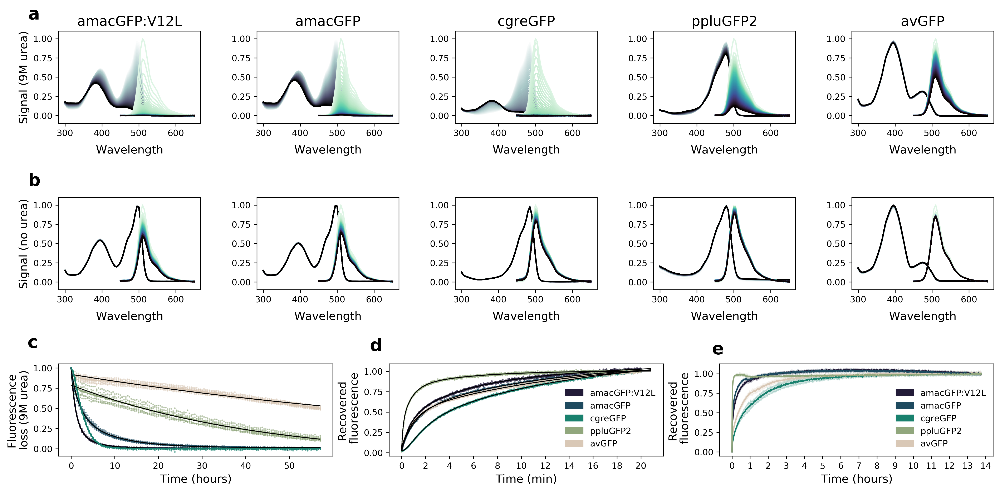

In [283]:
plt.figure(figsize=[16, 8], dpi=300)

for i,gene in zip(range(1,15,3),['amacV14L', 'amac', 'cgre', 'pplu', 'av']):
    plt.subplot(3,15,(i,i+2))
    plot_spectra(gene=gene, treatment='urea')
    label_plot_axis(t=names[gene],)
    plt.xlabel('Wavelength', labelpad=8)
    if i==1:
        plt.ylabel('Signal (9M urea)')
        plt.text(200, 1.25, 'a', fontsize=20, weight='semibold')
        
    ax2 = plt.subplot(3,15,(i+15, i+15+2))
    plot_spectra(gene=gene, treatment='pbs')
    plt.xlabel('Wavelength', labelpad=8)
#     ax2.xaxis.tick_top()
    if i==1:
        plt.ylabel('Signal (no urea)')    
        plt.text(200, 1.25, 'b', fontsize=20, weight='semibold')
        
# plt.tight_layout()
    
plt.subplot(3,15,(31,35))
plot_urea_fluo_loss()
label_plot_axis(y = 'Fluorescence\nloss (9M urea)', x = 'Time (hours)')
plt.text(-10, 1.25, 'c', fontsize=20, weight='semibold')

    
plt.subplot(3,15,(36,40))
plot_refolding('short')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-160, 1.25, 'd', fontsize=20, weight='semibold')

plt.subplot(3,15,(41,45))
plot_refolding('long')
plt.ylabel('Recovered\n fluorescence')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-4000, 1.25, 'e', fontsize=20, weight='semibold')
    
    
plt.tight_layout()

plt.savefig(os.path.join(figures_folder, 'eLife_final_figs' ,'elife_suppl_fig7.png'), dpi=300)

## Suppl. Fig. X: Effect of mutations in amacGFP and amacGFP:V14L

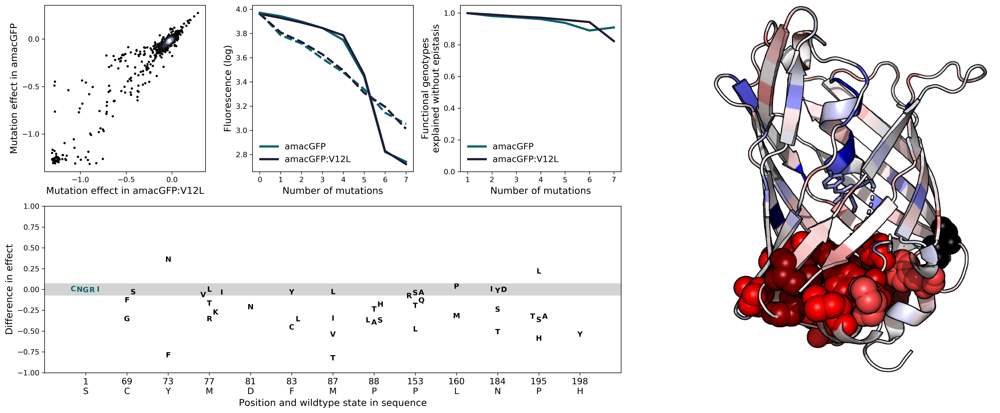

In [35]:
fig = plt.figure(figsize=[20,8], dpi=300)
# make_figure_letters(fig, {'a':(-0.03,1), 'b':(0.17,1), 'c':(0.38,1), 'd':(0.6,1), 'e':(-0.03,0.45)}, 
#                     fontsize=20)

plt.subplot(2,5,1)
scatter_amac_v14l_mut_effects()

plt.subplot(2,5,2)
cm = cmocean.cm.rain_r
amac_v14l_nmut_medians(n = 8)

plt.subplot(2,5,3)
amac_v14l_obs_exp_bright()

plt.subplot(2,5,(6,8))
amac_v14l_mutposeffect()

plt.subplot(2,5,(4,10))
show_image(os.path.join(figures_folder, 'other_images', 'amac_amacV14L_difference.png'))

plt.tight_layout()

# suppl. fig. 4

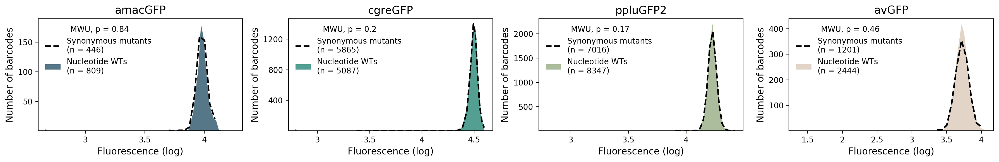

In [36]:
plt.figure(figsize=(18,3), dpi=200)
plt.axis('off')

yticks = {'amacGFP': [50,100,150], 'cgreGFP':[400,800,1200], 
          'ppluGFP':[500,1000,1500,2000], 'avGFP':[100,200,300,400]}
xticks = {'amacGFP': [3,3.5,4], 'cgreGFP':[3,3.5,4,4.5], 'ppluGFP':[3,3.5,4,4.5], 'avGFP':[1.5,2,2.5,3,3.5,4]}
xlims = {gene : (data_aa[(data_aa.gene==gene)]['brightness'].min() - 0.05, 
                 data_aa[(data_aa.gene==gene)]['brightness'].max() + 0.05)
                for gene in ['amacGFP','cgreGFP','ppluGFP','avGFP']}

for i,gene in zip([1,2,3,4], ['amacGFP','cgreGFP','ppluGFP','avGFP']):
    ax = plt.subplot(1,4,i)
    plot_wts_and_synmuts(gene, bcs, yticks=yticks[gene], xticks=xticks[gene])
#     if gene!='amacGFP':
#         plt.ylabel('')
    plt.xlim(xlims[gene])
    plt.title(names[gene], fontsize=14)
    
plt.tight_layout()

# Protein thermostability

amacV14L: L = 2.692551155667289, x0 = 80.38800006078053, k = 0.859351341629915, b = -3.1767309079670807
amac: L = 2.6140932241650328, x0 = 82.6303267048625, k = 0.7241312365215388, b = -3.337282815269062
cgre: L = 5.609848988918248, x0 = 71.24792360419332, k = 1.2684480435786951, b = -5.534120687527071
pplu: L = 1.9591876969557127, x0 = 86.38540787212203, k = 0.6297342164525306, b = -1.4568879092686993
av: L = -4.03077587259635, x0 = 83.72176080346874, k = 0.6685226611014845, b = -1.8771918640751692


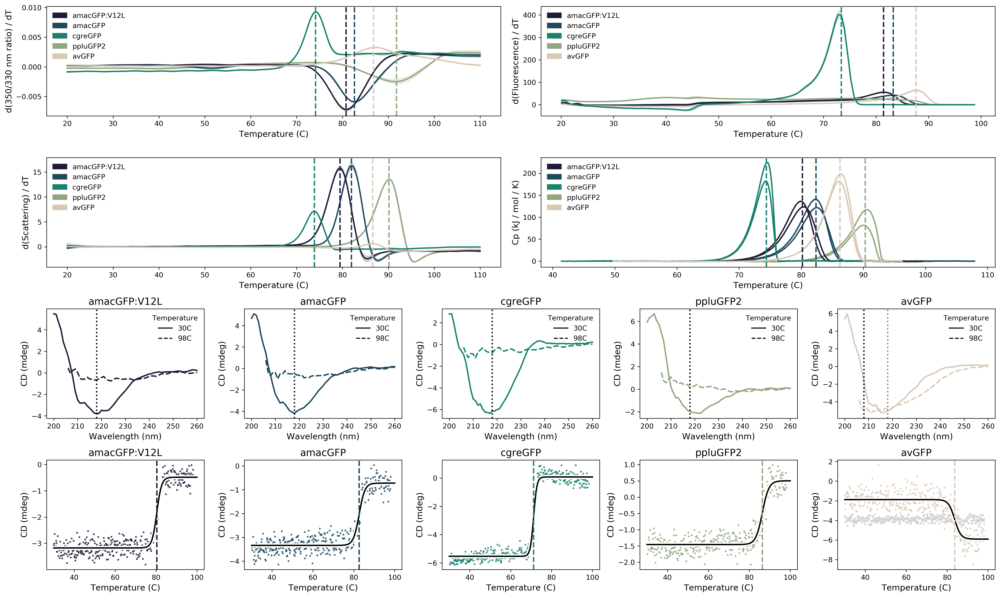

In [42]:
fig = plt.figure(figsize=[20,12], dpi=300)
plt.axis('off')

plt.subplot(4,10,(1,5))
label_plot_axis(y = 'd(350/330 nm ratio) / dT', fontsize_y=12)
plot_dsf('ratio')
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(6,10))
label_plot_axis(y = 'd(Fluorescence) / dT', fontsize_y=12)
plot_qpcr()
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(11,15))
label_plot_axis(y = 'd(Scattering) / dT', fontsize_y=12)
plot_dsf('scatter')
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

plt.subplot(4,10,(16,20))
label_plot_axis(y = 'Cp (kJ / mol / K)', fontsize_y=12)
plot_dsc()
legendary([colors[gene] for gene in ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP']], 
          ['amacGFP:V12L','amacGFP','cgreGFP','ppluGFP2','avGFP'], loc='upper left')

for i,gene in zip([21,23,25,27,29], ['amacV14L', 'amac', 'cgre', 'pplu', 'av']):
    plt.subplot(4,10,(i,i+1))
    plt.title(names[gene], fontsize=14)
    plot_cd_spectra(gene)
    plt.subplot(4,10,(i+10,i+11))
    plot_cd_melting(gene)
    plt.title(names[gene], fontsize=14)
    
plt.tight_layout()

# secmals

In [391]:
sec = pd.read_csv(os.path.join(structure_folder, 'secmals',
                              'secmals_raw.csv'))
sec_peaks = pd.read_csv(os.path.join(structure_folder, 'secmals',
                              'secmals_peak_weights.csv'))

In [398]:
sec_bestrep = {'amac':1, 'av':2, 'pplu':1, 'V14L':2, 'cgre':2}

In [399]:
peak_num = {'V14L':{4:(9.53, 89193, 0.45), 3:(9.9, 76369,1.06), 2:(10.5, 55843,31.27), 1:(11.5,28909,67.22)},
           'amac': {4:(9.57,110977,0.68), 3:(9.9,87143,1.92), 2:(10.5, 56064,46.09), 1:(11.5,30114,51.31)},
           'cgre': {2:(9.5,106915,0.7), 1:(11,55082,99.3)},
           'pplu': {1:(11.5, 104228, 97.51), 2:(8.2, 1341321, 2.49)},
           'av':{1:(11.5, 30166, 99.08), 2:(10.26, 51169, 0.92)}}

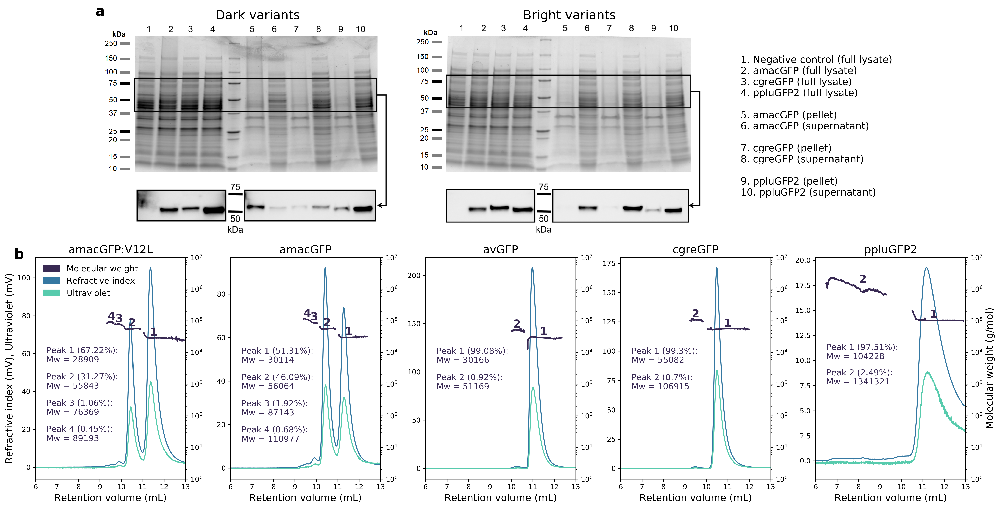

In [406]:
fig = plt.figure(figsize=[20,10], dpi=300)
plt.axis('off')

cm = sns.cm.mako

for i,gene in zip(range(6,11) ,['V14L','amac','av','cgre','pplu']):
    ax1 = fig.add_subplot(2,5,i)
    df = sec[(sec.gene==gene) & (sec.replicate==sec_bestrep[gene]) & (sec.retention_volume_mL<13)]
    plt.plot(df['retention_volume_mL'], df['refractive_index_mV'], color=cm(125), label='Refractive index')
    plt.plot(df['retention_volume_mL'], df['ultraviolet_mV'], color=cm(200), label='Ultraviolet')
#     plt.plot(df['retention_volume_mL'], df['right_angle_light_scatter_mV']-82)
    plt.xlim(6,13)
    plt.title(names[gene], fontsize=16)
    plt.xlabel('Retention volume (mL)', fontsize=14)
    
    if i==6:
        plt.ylabel('Refractive index (mV), Ultraviolet (mV)', fontsize=14)
        legendary([cm(50), cm(125), cm(200)], ['Molecular weight', 'Refractive index', 'Ultraviolet'],
                 loc='upper left', fontsize=12)
        plt.text(5, 110, 'b', fontsize=20, weight='semibold')
        
    y = ax1.get_ylim()
    j = 0
    for peak in sorted(peak_num[gene]):
        plt.text(6.5, y[1]/2 - j, 
                 f'Peak {peak} ({peak_num[gene][peak][2]}%):\nMw = {peak_num[gene][peak][1]}', color=cm(50),
                size=12)
        j += y[1]/8
        
#     elif i==2:
#         y = ax1.get_ylim()
#         plt.text(6.5, y[1]/2, 'Peak 1 (0.68%):\nMw = 110 977', )
    
    ax2 = ax1.twinx()
    df = sec_peaks[(sec_peaks.gene==gene) & (sec_peaks.replicate==sec_bestrep[gene])]
    plt.plot(df['retention_volume_mL'], df['molecular_weight_g/mol'], color=cm(50), linewidth=2,
            label = 'Molecular weight')

    plt.yscale('log')
    plt.ylim(1, 10000000)
#     plt.yticks([10**i for i in range(0,7)], [10**i for i in range(0,7)])
#     plt.yticks([28000, 54000, 82000, 110000],[28000, 54000, 82000, 110000])
    if i==10:
        plt.ylabel('Molecular weight (g/mol)', fontsize=14)    
    
        

    for peak in peak_num[gene]:
        plt.text(peak_num[gene][peak][0], peak_num[gene][peak][1], peak, color=cm(50), weight='semibold',
                horizontalalignment='center', verticalalignment='bottom', fontsize=16)
        
    # mol weight peaks!
plt.tight_layout()      

plt.subplot(2,5,(1,4))
show_image(os.path.join(figures_folder, 'other_images','WB_p10_p3.png'))

plt.subplot(2,5,5)
plt.axis('off')
plt.text(-4,1.0,'Dark variants',rotation=0,size=18,verticalalignment='center')
plt.text(-1.95,1.0,'Bright variants',rotation=0,size=18,verticalalignment='center')
plt.text(-4.8, 1, 'a', weight='semibold', fontsize=20)

endline = '\n' 
keys = {1:'Negative control (full lysate)', 2:'amacGFP (full lysate)', 3:'cgreGFP (full lysate)',
       4:'ppluGFP2 (full lysate)\n', 5:'amacGFP (pellet)', 6:'amacGFP (supernatant)\n', 7:'cgreGFP (pellet)',
       8:'cgreGFP (supernatant)\n', 9:'ppluGFP2 (pellet)', 10:'ppluGFP2 (supernatant)'}

plt.text(-0.5, 0.5, endline.join([f'{i}. {keys[i]}' for i in range(1,11)]),
        size=14, verticalalignment='center')
    
plt.savefig(os.path.join(figures_folder, 'eLife_final_figs', 'elife_suppl_fig8.png'), dpi=300)

# about predictions

In [25]:
import pickle

In [26]:
bgs = pickle.load(open(os.path.join(analysis_folder, 'notebooks', 
                                   'mutation_effects_by_background_log10.pkl'), 'rb'))

In [15]:
predictions

,full_seq,aa_genotype_native,aa_genotype_pseudo,gene,distance,non_extant_muts,katya_fitness,aubin_fitness,mutated_nt_coding,plate,sq_name,well,fiji_value,fiji_log_value,fiji_log_scaled,fiji_library_values
0,MSKGDELFTGIVPVLIELDGDVHGHKFSVRGEGEGDADYGKLEIKF...,E4D:E89Q:D128A:D179G:D189N:M232T,E7D:E93Q:D132A:D183G:D193N:M240T,amac,6.0,6.0,4.047982,4.071260,ATGAGCAAGGGCGATGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_3512,A1,48,1.681241,0.891257,3.827357
1,MSKGEELFTGIVPVLIELDGDVQGHKFSVRGEGEGDADYGKLEIKF...,H22Q:N148Y:G159A:L177F:Y181C:C226G,H25Q:N152Y:G163A:L181F:Y185C:C234G,amac,6.0,6.0,3.980428,4.153657,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_2908,B1,75,1.875061,1.051326,4.038406
2,MSKGEELFTGIVPVLIELDGDVHGHKFSVRGEGEGDADYGKLEIKF...,L140M:N148Y:K165Q:V185F:S201R:L235P,L144M:N152Y:K169Q:V189F:S208R:L243P,amac,6.0,6.0,4.091554,4.189361,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_3306,C1,75,1.875061,1.051326,4.038406
3,MSKGEELFTGIVPVLIELNGDVHGHKFSVRGEGEGDADYGKLEIKF...,D18N:D101A:D116A:A156P:Y181S:H230D,D21N:D105A:D120A:A160P:Y185S:H238D,amac,6.0,6.0,4.077757,4.123427,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_3873,D1,47,1.672098,0.883706,3.817401
4,MSKGEELFTGIVPVLIELNGNVHGHKFSVRGEGEGDADYGKLEIKC...,D18N:D20N:F45C:K51R:N134K:I166V,D21N:D23N:F48C:K54R:N138K:I170V,amac,6.0,5.0,4.305977,4.266685,ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGA...,1,amac6_930,E1,71,1.851258,1.031668,4.012487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,MTEPSVAAKLFEEEIPYITELEGDIDGKKFSIRGVGTGDAATGTIK...,A2E:L3P:T4S:E5V:G6A:K12E:V24I:E25D:M27K:I30S:K...,A2E:L3P:T4S:E5V:G6A:K12E:V24I:E25D:M27K:I30S:K...,cgre,48.0,12.0,7.048356,6.082765,ATGACTGAACCGTCCGTGGCGGCGAAGCTGTTCGAAGAGGAGATTC...,3,cgre48_1050,D9,48,1.681241,0.580551,3.772918
260,MTEPPGGAKLFDEEIPYITVLEGDVEGMKFTIRGVGTGNATTGTIK...,A2E:L3P:T4P:E5G:E11D:K12E:E19V:I30T:K32R:E34V:...,A2E:L3P:T4P:E5G:E11D:K12E:E19V:I30T:K32R:E34V:...,cgre,48.0,24.0,7.164687,5.943640,ATGACTGAACCGCCGGGCGGCGCGAAGCTGTTCGATGAGGAGATTC...,3,cgre48_1319,E9,4,0.602060,0.000000,2.770852
261,MIERPVGAMLFDKEIPYVTELEGDVEGKKFTIKGVGTGDATTGTIR...,T1I:A2E:L3R:T4P:E5V:K8M:E11D:I17V:M27K:I30T:E3...,T1I:A2E:L3R:T4P:E5V:K8M:E11D:I17V:M27K:I30T:E3...,cgre,48.0,24.0,7.231022,5.978107,ATGATAGAACGCCCGGTCGGCGCGATGCTGTTCGACAAAGAGATTC...,3,cgre48_1414,F9,183,2.262451,0.924062,4.365841
262,MAEPPEGAKLFDKEIPYVTELEGVVEGKKFTIKGVGTGNATTGTIR...,T1A:A2E:L3P:T4P:E11D:I17V:D23V:M27K:I30T:E34V:...,T1A:A2E:L3P:T4P:E11D:I17V:D23V:M27K:I30T:E34V:...,cgre,48.0,23.0,7.116255,5.887518,ATGGCCGAGCCACCCGAAGGCGCGAAGCTGTTCGATAAAGAGATTC...,3,cgre48_1770,G9,5,0.698970,0.000000,2.770852


# theoretical number of genotypes at each distance

In [79]:
from math import factorial

def product(iterable):
    prod = 1
    for n in iterable:
        prod *= n
    return prod

def npr(n, r):
    """
    Calculate the number of ordered permutations of r items taken from a
    population of size n.

    >>> npr(3, 2)
    6
    >>> npr(100, 20)
    1303995018204712451095685346159820800000
    """
    assert 0 <= r <= n
    return product(range(n - r + 1, n + 1))

def ncr(n, r):
    """
    Calculate the number of unordered combinations of r items taken from a
    population of size n.

    >>> ncr(3, 2)
    3
    >>> ncr(100, 20)
    535983370403809682970
    >>> ncr(100000, 1000) == ncr(100000, 99000)
    True
    """
    assert 0 <= r <= n
    if r > n // 2:
        r = n - r
    return npr(n, r) // factorial(r)

In [195]:
l = 235
n = 6
ncr(l,n) * (19**n)/50

2.0638899983798717e+17

In [183]:
10**21

1000000000000000000000

In [192]:
200 / (4*10**21)

5e-20

In [114]:
cgre_nt_wt = 'ATGACTGCACTTACCGAAGGCGCGAAGCTGTTCGAAAAAGAGATTCCCTATATCACCGAGCTGGAGGGCGACGTAGAGGGCATGAAGTTCATCATTAAGGGCGAGGGCACTGGCGATGCCACCACGGGCACCATCAAGGCGAAGTACATCTGCACCACCGGCGACCTGCCCGTGCCCTGGGCTACCATCCTGTCATCCCTGTCGTACGGCGTGTTTTGCTTCGCTAAATACCCCCGCCACATTGCGGACTTCTTCAAGTCCACCCAACCCGATGGCTACAGTCAGGACCGCATCATCTCGTTCGACAATGACGGCCAGTACGACGTGAAAGCCAAAGTGACGTATGAGAACGGTACACTATACAACCGCGTTACCGTGAAGGGCACTGGTTTCAAGTCAAACGGCAACATCCTGGGGATGCGCGTTTTGTACCACTCGCCACCCCACGCAGTCTATATCTTGCCTGACCGCAAGAATGGTGGCATGAAGATTGAGTATAACAAGGCCTTTGACGTAATGGGCGGCGGTCACCAGATGGCCCGTCACGCCCAGTTCAACAAGCCCCTTGGCGCATGGGAGGAAGATTACCCCCTGTACCACCACCTGACAGTGTGGACTAGCTTCGGCAAAGACCCCGATGACGACGAGACAGATCACCTTACGATCGTCGAGGTCATTAAGGCCGTAGACTTGGAAACGTACCGC'
amac_nt_wt = 'ATGAGCAAGGGCGAGGAGCTGTTCACCGGGATCGTGCCCGTCCTGATTGAGCTGGACGGCGACGTACACGGCCACAAGTTCAGCGTGCGCGGCGAGGGCGAGGGCGATGCCGACTACGGCAAGCTGGAGATCAAGTTCATCTGCACCACCGGCAAGCTGCCCGTGCCCTGGCCCACCCTCGTGACCACCCTGTCGTACGGCATTTTGTGCTTCGCGCGCTACCCCGAACACATGAAGATGAACGACTTCTTCAAGTCCGCCATGCCCGAAGGCTACATCCAGGAGCGCACCATCTTCTTCCAGGACGACGGCAAGTACAAGACCCGTGGGGAGGTGAAGTTCGAGGGCGACACACTGGTGAACCGCATCGAGCTGAAGGGCATGGACTTCAAGGAGGACGGCAACATCCTGGGGCACAAGCTGGAGTACAACTTTAACAGCCACAACGTCTATATCATGCCAGACAAGGCTAATAACGGCCTGAAGGTGAACTTCAAGATCCGCCACAACATCGAGGGCGGCGGGGTGCAGCTCGCCGACCACTACCAGACGAACGTTCCCTTGGGCGACGGCCCCGTGCTGATCCCCATCAACCACTACCTGAGCTGTCAGACAGCCATCAGCAAAGACCGTAACGAGACTCGCGATCACATGGTCTTTCTGGAGTTCTTTAGTGCCTGTGGGCATACTCACGGCATGGACGAGCTGTACAAG'
pplt_nt_wt = 'ATGCCAGCCATGAAAATCGAATGTCGCATTACGGGCACTCTGAACGGCGTGGAGTTCGAGCTCGTAGGCGGGGGCGAGGGCACCCCGGAACAGGGCCGCATGACCAACAAGATGAAGTCCACCAAAGGCGCACTGACCTTTTCTCCGTACCTGCTCAGCCACGTTATGGGTTACGGCTTCTATCACTTCGGCACGTACCCCTCCGGTTACGAGAATCCGTTCCTCCACGCTATCAACAACGGTGGCTACACAAATACGCGCATTGAAAAGTACGAGGACGGCGGCGTCCTTCACGTATCATTCTCATATCGTTATGAGGCGGGTCGCGTGATCGGCGACTTCAAGGTAGTGGGCACAGGCTTCCCTGAGGACTCAGTCATCTTTACGGACAAGATCATTCGTTCGAACGCAACCGTTGAGCATTTGCATCCAATGGGCGACAACGTGCTGGTAGGCTCGTTCGCTCGCACCTTTTCCCTGCGCGACGGCGGCTATTACTCATTTGTGGTAGACTCACACATGCACTTCAAAAGCGCGATCCACCCGAGTATTCTGCAGAATGGCGGTCCTATGTTTGCTTTTCGCCGCGTAGAAGAACTCCACAGCAACACTGAACTGGGGATCGTCGAGTATCAACACGCCTTCAAGACGCCCATTGCTTTCGCA'
av_nt_wt = 'ATGAGCAAGGGCGAGGAGCTGTTCACCGGGGTGGTGCCCATCCTGGTCGAGCTGGACGGCGACGTAAACGGCCACAAGTTCAGCGTGTCCGGCGAGGGCGAGGGCGATGCCACCTACGGCAAGCTGACCCTGAAGTTCATCTGCACCACCGGCAAGCTGCCCGTGCCCTGGCCCACCCTCGTGACCACCCTGTCGTACGGCGTGCAGTGCTTCAGCCGCTACCCCGACCACATGAAGCAGCACGACTTCTTCAAGTCCGCCATGCCCGAAGGCTACGTCCAGGAGCGCACCATCTTCTTCAAGGACGACGGCAACTACAAGACCCGCGCCGAGGTGAAGTTCGAGGGCGACACACTGGTGAACCGCATCGAGCTGAAGGGCATCGACTTCAAGGAGGACGGCAACATCCTGGGGCACAAGCTGGAGTACAACTACAACAGCCACAACGTCTATATCATGGCCGACAAGCAGAAGAACGGCATCAAGGTGAACTTCAAGATCCGCCACAACATCGAGGACGGCAGCGTGCAGCTCGCCGACCACTACCAGCAGAACACCCCCATCGGCGACGGCCCCGTGCTGCTGCCCGACAACCACTACCTGAGCACCCAGTCCGCCCTGAGCAAAGACCCCAACGAGAAGCGCGATCACATGGTCCTGCTGGAGTTCGTGACCGCCGCCGGGATCACTCACGGCATGGACGAGCTGTACAAG'

In [128]:
genetic_code = {'TTT': "F", 'TTC': "F", 'TTA': "L", 'TTG': "L", 'TCT': "S", 'TCC': "S", 'TCA': "S", 'TCG': "S",
                'TAT': "Y", 'TAC': "Y", 'TAA': "*", 'TAG': "*", 'TGT': "C", 'TGC': "C", 'TGA': "*", 'TGG': "W",
                'CTT': "L", 'CTC': "L", 'CTA': "L", 'CTG': "L", 'CCT': "P", 'CCC': "P", 'CCA': "P", 'CCG': "P",
                'CAT': "H", 'CAC': "H", 'CAA': "Q", 'CAG': "Q", 'CGT': "R", 'CGC': "R", 'CGA': "R", 'CGG': "R",
                'ATT': "I", 'ATC': "I", 'ATA': "I", 'ATG': "M", 'ACT': "T", 'ACC': "T", 'ACA': "T", 'ACG': "T",
                'AAT': "N", 'AAC': "N", 'AAA': "K", 'AAG': "K", 'AGT': "S", 'AGC': "S", 'AGA': "R", 'AGG': "R",
                'GTT': "V", 'GTC': "V", 'GTA': "V", 'GTG': "V", 'GCT': "A", 'GCC': "A", 'GCA': "A", 'GCG': "A",
                'GAT': "D", 'GAC': "D", 'GAA': "E", 'GAG': "E", 'GGT': "G", 'GGC': "G", 'GGA': "G", 'GGG': "G",
               
               'CTN':'L', 'GTN':'V', 'TCN':'S', 'CCN':'P', 'ACN':'T', 'GCN':'A', 'CGN':'R', 'GGN':'G'}

def translate(seq, genetic_code=genetic_code):
#     assert seq[0:3] == 'ATG'
    protein = ''
    for i in range(0, len(seq), 3):
        if i+3 > len(seq):
            break
        try:
            protein += genetic_code[seq[i:i+3]]
        except KeyError:
            protein = np.nan
            break
    return protein

def get_1nt_prots(seq):
    neighbors = []
    for i in range(len(seq)):
        neighbors.extend([seq[:i] + nt + seq[i+1:] for nt in 'ATCG' if nt!=seq[i]])
    neighbors = [translate(s) for s in neighbors]
    print(len(neighbors))
#     neighbors = set(neighbors)
    neighbors = set([n for n in neighbors if '*' not in n])
    return len(neighbors)

In [149]:
get_1nt_prots(pplt_nt_wt)

1998


1332

In [150]:
1163/1332

0.8731231231231231